# **Drive mounting and Library Installation HealPy:**

---



In [ ]:
!pip install healpy
import numpy as np
import healpy as hp
import matplotlib.pyplot as plt
from google.colab import drive
drive.mount('/content/drive')

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.9/8.9 MB 56.6 MB/s eta 0:00:00
Mounted at /content/drive


# **Library Installation NaMaster**

---



In [ ]:
!apt-get install -y libtool automake autoconf
!apt-get install -y libgsl-dev libfftw3-dev libfftw3-mpi-dev libcfitsio-dev gfortran

# %cd /content/NaMaster   # if already cloned
# OR reclone if missing:
!git clone https://github.com/LSSTDESC/NaMaster.git
%cd NaMaster

!pip install cython numpy==1.26.4
!python setup.py build_ext --inplace
!python setup.py install

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
autoconf is already the newest version (2.71-2).
autoconf set to manually installed.
automake is already the newest version (1:1.16.5-1.3).
automake set to manually installed.
Suggested packages:
  libtool-doc gcj-jdk
The following NEW packages will be installed:
  libtool
0 upgraded, 1 newly installed, 0 to remove and 41 not upgraded.
Need to get 164 kB of archives.
After this operation, 1,227 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/main amd64 libtool all 2.4.6-15build2 [164 kB]
Fetched 164 kB in 16s (10.4 kB/s)
Selecting previously unselected package libtool.
(Reading database ... 121713 files and directories currently installed.)
Preparing to unpack .../libtool_2.4.6-15build2_all.deb ...
Unpacking libtool (2.4.6-15build2) ...
Setting up libtool (2.4.6-15build2) ...
Processing triggers for man-db (2.10.2-1) ...
Reading package lists... Done
B

running build_ext
building '_nmtlib' extension
creating build/temp.linux-x86_64-cpython-312/pymaster
x86_64-linux-gnu-gcc -fno-strict-overflow -Wsign-compare -DNDEBUG -g -O2 -Wall -g -fstack-protector-strong -Wformat -Werror=format-security -g -fwrapv -O2 -fPIC -I/usr/local/lib/python3.12/dist-packages/numpy/core/include -I./src/ -I./_deps/include/ -I/usr/include/python3.12 -c pymaster/namaster_wrap.c -o build/temp.linux-x86_64-cpython-312/pymaster/namaster_wrap.o -O4 -fopenmp
creating build/lib.linux-x86_64-cpython-312
x86_64-linux-gnu-gcc -shared -Wl,-O1 -Wl,-Bsymbolic-functions -Wl,-Bsymbolic-functions -g -fwrapv -O2 build/temp.linux-x86_64-cpython-312/pymaster/namaster_wrap.o ./_deps/lib/libnmt.a ./_deps/lib/libchealpix.a -L./_deps/lib/ -L/usr/lib/x86_64-linux-gnu -lcfitsio -lgsl -lgslcblas -lm -lfftw3 -lfftw3_omp -lgomp -o build/lib.linux-x86_64-cpython-312/_nmtlib.cpython-312-x86_64-linux-gnu.so -O4 -fopenmp
/usr/bin/ld: cannot find ./_deps/lib/libnmt.a: No such file or directory

In [ ]:
# Working code
# Step 1: Install dependencies
!apt-get install -y libgsl-dev libfftw3-dev libcfitsio-dev

# Step 2: Clone NaMaster repo
!git clone https://github.com/LSSTDESC/NaMaster.git

# Step 3: Go into NaMaster directory
%cd NaMaster

# Step 4: Install with pip (this builds from source)
!pip install .


In [ ]:
# Downgrade Python to 3.10
!sudo apt-get install python3.10 python3.10-dev python3.10-distutils -y
!sudo update-alternatives --install /usr/bin/python3 python3 /usr/bin/python3.10 2
!sudo update-alternatives --config python3

# Install pip for Python 3.10
!wget https://bootstrap.pypa.io/get-pip.py
!python3 get-pip.py

# Restart runtime after this step


In [ ]:
!apt-get install -y libtool automake autoconf

In [ ]:
# System dependencies (already mostly installed, but repeat for safety)
!apt-get install -y libgsl-dev libfftw3-dev libfftw3-mpi-dev libcfitsio-dev gfortran

# Clone NaMaster
!git clone https://github.com/LSSTDESC/NaMaster.git
%cd NaMaster

# Install build helpers
!pip install cython numpy==1.26.4

# Force build from setup.py
!python setup.py build_ext --inplace
!python setup.py install


In [ ]:
%cd /content/NaMaster
!pip install .

In [ ]:
%cd /content

In [ ]:
!ls /content/

In [ ]:
# ===== Test imports =====
import pymaster as nmt
import healpy as hp

print("NaMaster version:", nmt.__version__)
print("Healpy version:", hp.__version__)

# **1. Generate random realizations of CMB sky based on an input power spectrum (Cl).**

---



In [ ]:
cl = hp.read_cl('/gdrive/MyDrive/Healpix_3.83_2024Nov13/Healpix_3.83/test/cl.fits')

In [ ]:
cl[0] # Temperature data lies in first row

In [ ]:
num_maps = 100
nside = 128

cmb_maps = []  # Empty list ist to store the generated maps

for i in range(num_maps):
  cmb_map = hp.synfast(cl[0], nside, new=True)   # Use cl[0] to provide the first row of power spectrum.
  cmb_maps.append(cmb_map) # Each map is saved into the cmb_maps list.


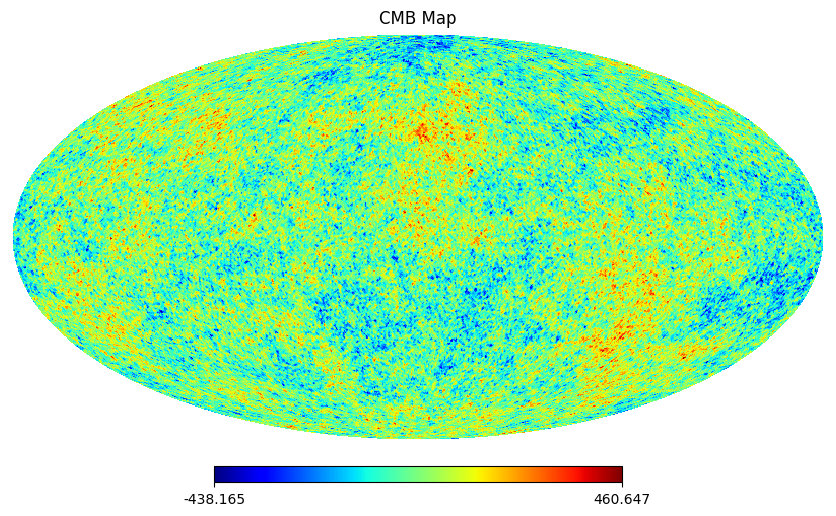

In [ ]:
i=99
hp.mollview(cmb_maps[i], title=f"Simulated CMB Map (NSIDE=128) from Planck TT Spectrum", cmap="jet")  # Visualize the ith map
plt.show() # To visualise the sky maps

# **2. Apply a gaussian/beam transfer function from a file (ascii/fits) to the CMB map**

---



In [ ]:
cmb_map = hp.read_map('/gdrive/MyDrive/Healpix_3.83_2024Nov13/Healpix_3.83/test/map.fits')

<>:4: SyntaxWarning: invalid escape sequence '\e'
<>:5: SyntaxWarning: invalid escape sequence '\e'
<>:4: SyntaxWarning: invalid escape sequence '\e'
<>:5: SyntaxWarning: invalid escape sequence '\e'
/tmp/ipython-input-759773553.py:4: SyntaxWarning: invalid escape sequence '\e'
  plt.xlabel('Multipole moment $\ell$')
/tmp/ipython-input-759773553.py:5: SyntaxWarning: invalid escape sequence '\e'
  plt.ylabel('Beam window function $B_\ell$')


Text(0, 0.5, 'Beam window function $B_\\ell$')

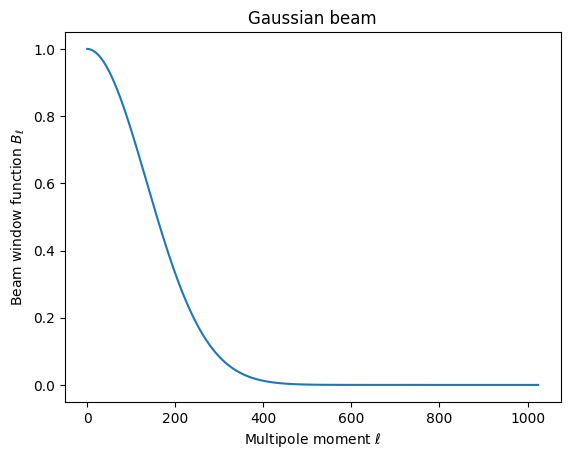

In [ ]:
beam = hp.sphtfunc.gauss_beam(np.deg2rad(1), lmax=1024) # Creating a gaussian beam using healpy.
plt.plot(beam)
plt.title("Gaussian beam")
plt.xlabel('Multipole moment $\ell$')
plt.ylabel('Beam window function $B_\ell$')


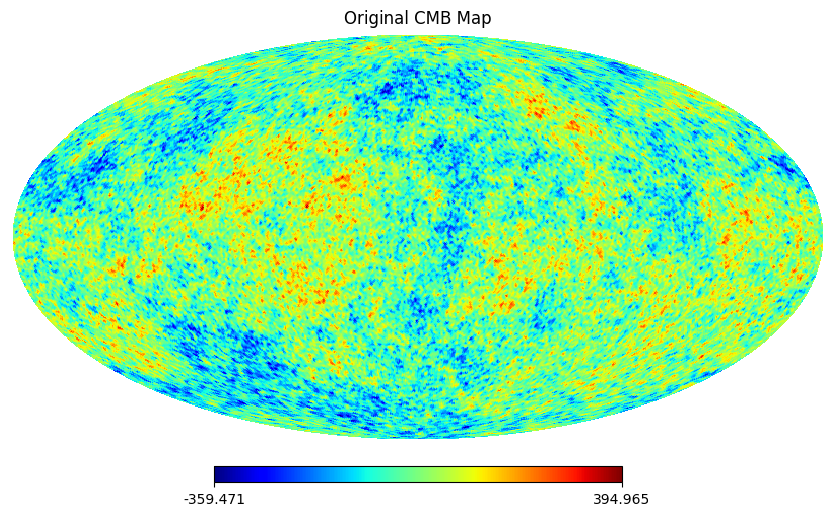

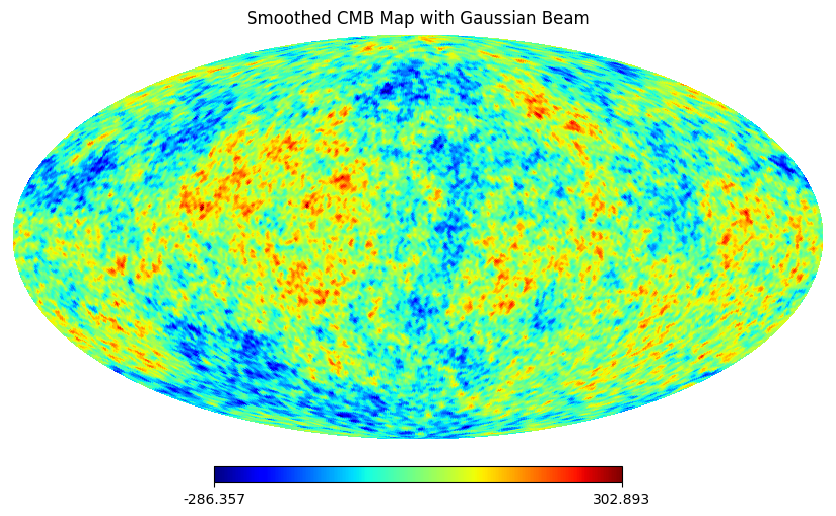

In [ ]:
cmb_map_smoothed_with_gaussian_beam = hp.sphtfunc.smoothing(cmb_map,beam_window=beam)
hp.mollview(cmb_map, title="Original CMB Map",cmap="jet")
hp.mollview(cmb_map_smoothed_with_gaussian_beam, title="Smoothed CMB Map with Gaussian Beam",cmap='jet')

# **3. Recover Input Cl from 100 Simulations + Plot Mean & Errors**

---


In [ ]:
nside = 128
lmax = 3 * nside - 1
num_maps = 100

cll = hp.read_cl('/content/drive/MyDrive/Healpix_3.83_2024Nov13/Healpix_3.83/test/cl.fits')

cl =cll[0]

all_cl = [] # Empty list to store cl read from maps.

for i in range(num_maps):
    cmb_map = hp.synfast(cl, nside=nside, lmax=lmax) # Creating maps from these cls.
    cl_out = hp.anafast(cmb_map, lmax=lmax) # Reading cl from maps.
    all_cl.append(cl_out) # Adding these cl one by one to the list.

all_cl = np.array(all_cl) # Creating an array out of the list.

In [ ]:
all_cl

array([[5.46736169e-09, 3.42175435e-10, 8.47268498e+02, ...,
        6.99944847e-02, 6.86323933e-02, 6.66229113e-02],
       [3.23542827e-11, 6.50763267e-09, 4.18352610e+02, ...,
        6.91721347e-02, 7.37451147e-02, 7.19956196e-02],
       [3.17045574e-09, 1.33694849e-11, 1.01659279e+03, ...,
        7.07656212e-02, 7.25366878e-02, 7.37668969e-02],
       ...,
       [1.33639872e-09, 7.85780760e-09, 4.49542163e+02, ...,
        7.39497893e-02, 7.24165625e-02, 6.78311326e-02],
       [2.16277939e-09, 8.15625262e-09, 5.60120764e+02, ...,
        7.67599111e-02, 7.17028090e-02, 6.50929952e-02],
       [1.38870314e-10, 1.95328315e-10, 3.54945276e+02, ...,
        7.68229816e-02, 7.21226901e-02, 6.85264654e-02]])

In [ ]:
all_cl.shape

(100, 384)

In [ ]:
#So we have to take mean and standard deviation along axis=0 (column wise)
mean_cl=np.mean(all_cl,axis=0) # Mean of all cls.
std_cl=np.std(all_cl,axis=0) # Standard deviation of all cls.

In [ ]:
#Generating an array ell=0:(3*nside-1)
ell = np.arange(0, 3*nside-1)

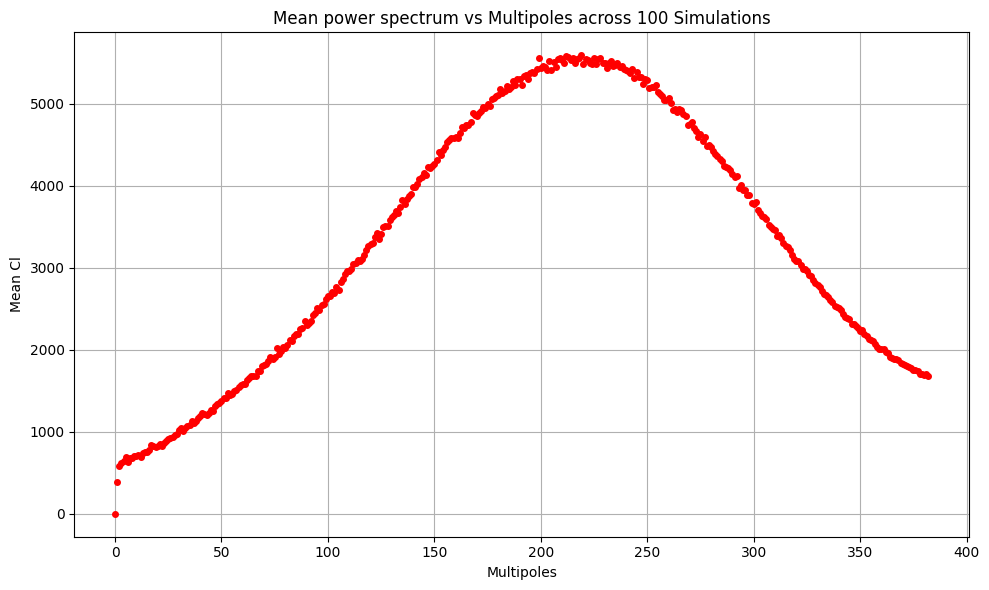

In [ ]:
#Plotting
plt.figure(figsize=(10, 6))
plt.plot(ell,mean_cl[1:]*ell*(ell+1)/(2*np.pi), 'o', markersize=4,color='red')
plt.xlabel('Multipoles')
plt.ylabel('Mean Cl')
plt.title('Mean power spectrum vs Multipoles across 100 Simulations')
plt.grid(True)
plt.tight_layout()
plt.show()

<>:7: SyntaxWarning: invalid escape sequence '\e'
<>:8: SyntaxWarning: invalid escape sequence '\e'
<>:7: SyntaxWarning: invalid escape sequence '\e'
<>:8: SyntaxWarning: invalid escape sequence '\e'
/tmp/ipython-input-126125747.py:7: SyntaxWarning: invalid escape sequence '\e'
  plt.xlabel('$\ell$',fontsize=14)
/tmp/ipython-input-126125747.py:8: SyntaxWarning: invalid escape sequence '\e'
  plt.ylabel('$C_\ell$',fontsize=14)


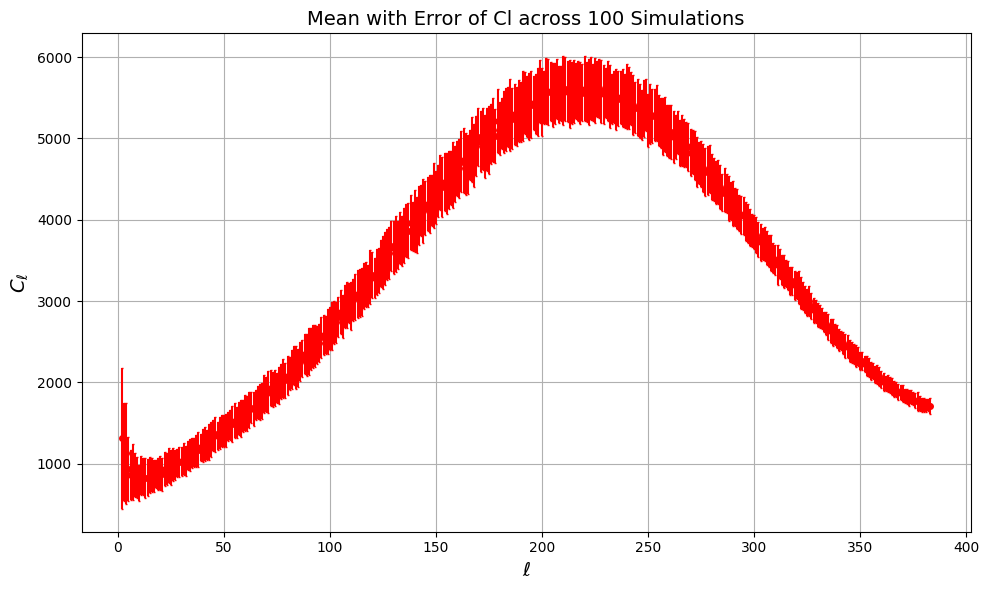

In [ ]:
#Plot mean_cl with std_cl as errorbars with ell=np.arrange(3*nside) starting from ell=2

#plotting
plt.figure(figsize=(10, 6))
ell = np.arange(2, 3 * nside) #starting from ell=2
plt.errorbar(ell, mean_cl[2:]*ell*(ell+1)/(2*np.pi), yerr=std_cl[2:]*ell*(ell+1)/(2*np.pi), fmt='o', markersize=4, color='red', capsize=1) #Plot mean_cl with std_cl as errorbars
plt.xlabel('$\ell$',fontsize=14)
plt.ylabel('$C_\ell$',fontsize=14)
plt.title('Mean with Error of Cl across 100 Simulations',fontsize=14)
plt.grid(True)
plt.tight_layout()
plt.show()


<>:8: SyntaxWarning: invalid escape sequence '\e'
<>:9: SyntaxWarning: invalid escape sequence '\e'
<>:8: SyntaxWarning: invalid escape sequence '\e'
<>:9: SyntaxWarning: invalid escape sequence '\e'
/tmp/ipython-input-1338090410.py:8: SyntaxWarning: invalid escape sequence '\e'
  plt.xlabel('$\ell$',fontsize=14)
/tmp/ipython-input-1338090410.py:9: SyntaxWarning: invalid escape sequence '\e'
  plt.ylabel('$D_\ell = \ell/(\ell+1)C_\ell/(2\pi)$',fontsize=14)


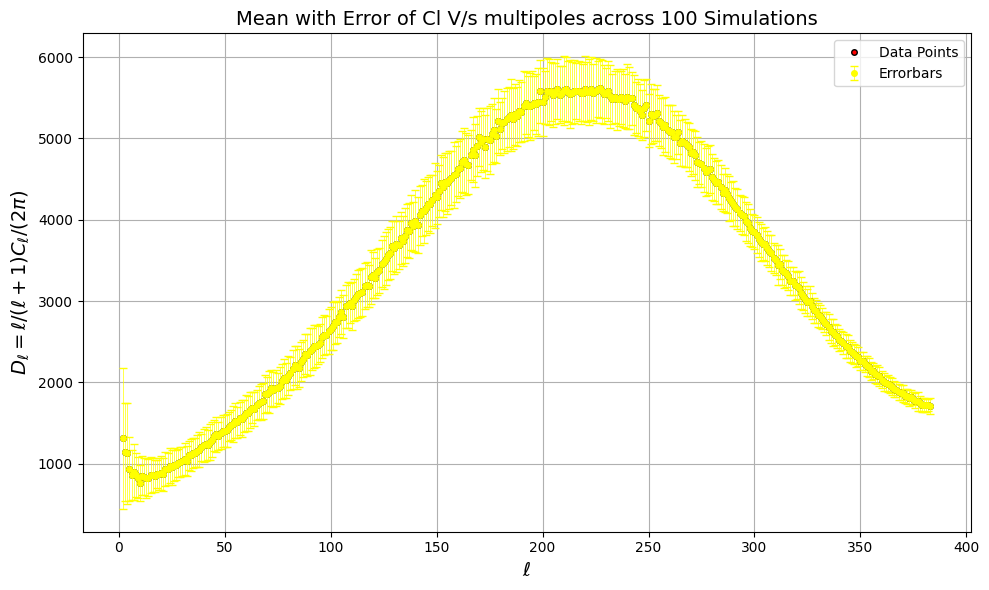

In [ ]:
#plot mean_cl with std_cl as errorbars with ell=np.arrange(3*nside) starting from ell=2 with data points in blue and errorbars in red color

#plotting
plt.figure(figsize=(10, 6))
ell = np.arange(2, 3 * nside) #starting from ell=2
plt.errorbar(ell, mean_cl[2:]*ell*(ell+1)/(2*np.pi), yerr=std_cl[2:]*ell*(ell+1)/(2*np.pi), fmt='o', markersize=4, color='yellow', elinewidth=0.5, capsize=3, label='Errorbars') #Plot mean_cl with std_cl as errorbars
plt.plot(ell, mean_cl[2:]*ell*(ell+1)/(2*np.pi), 'o', markersize=4, color='red', markeredgecolor='black', label='Data Points') # Data points in blue
plt.xlabel('$\ell$',fontsize=14)
plt.ylabel('$D_\ell = \ell/(\ell+1)C_\ell/(2\pi)$',fontsize=14)
plt.title('Mean with Error of Cl V/s multipoles across 100 Simulations',fontsize=14)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


# 4. Upgrade/downgrade maps - compute the power spectrum from an nside=512 map, downgrade it to nside=32,64,128 and compute the power spectrum from each of these low resolution maps, and make a comparison plot.

---



In [ ]:
original_cl=hp.read_cl('/gdrive/MyDrive/Healpix_3.83_2024Nov13/Healpix_3.83/test/cl.fits')
original_cl
cl=original_cl[0]

In [ ]:
nside_high=1024
nside_low_1=16
nside_low_2=32
nside_low_3=64
nside_low_4=128
#lmax=3*nside_high-1
cmb_map_high = hp.synfast(cl, nside=nside_high, lmax=lmax) #Reading original cl.
cmb_map_low_1 = hp.ud_grade(cmb_map_high, nside_out=nside_low_1) #Downgrading resolution one by one
cmb_map_low_2 = hp.ud_grade(cmb_map_high, nside_out=nside_low_2)
cmb_map_low_3 = hp.ud_grade(cmb_map_high, nside_out=nside_low_3)
cmb_map_low_4 = hp.ud_grade(cmb_map_high, nside_out=nside_low_4)

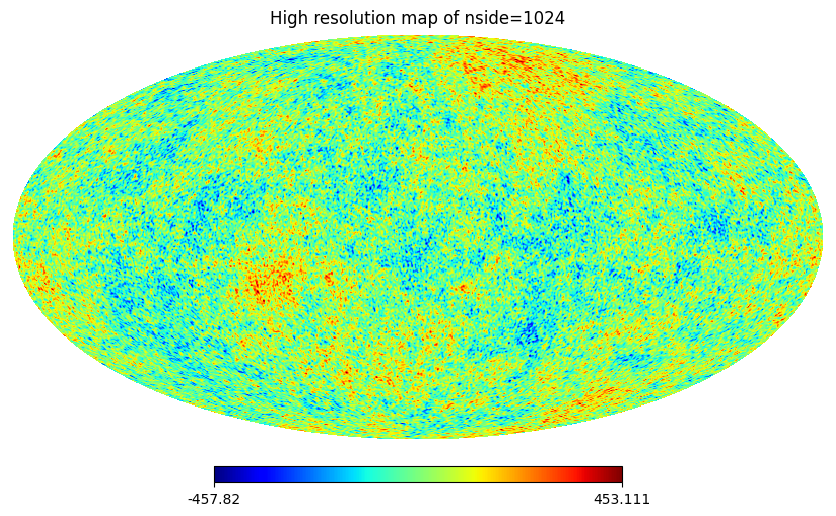

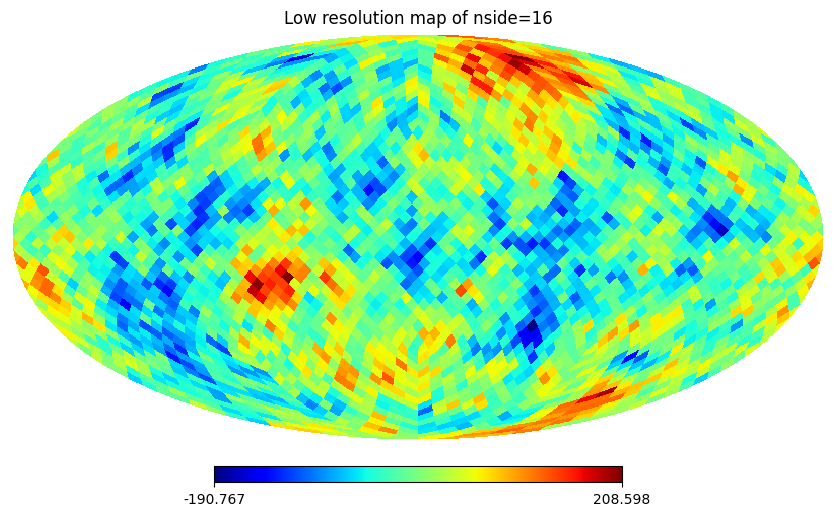

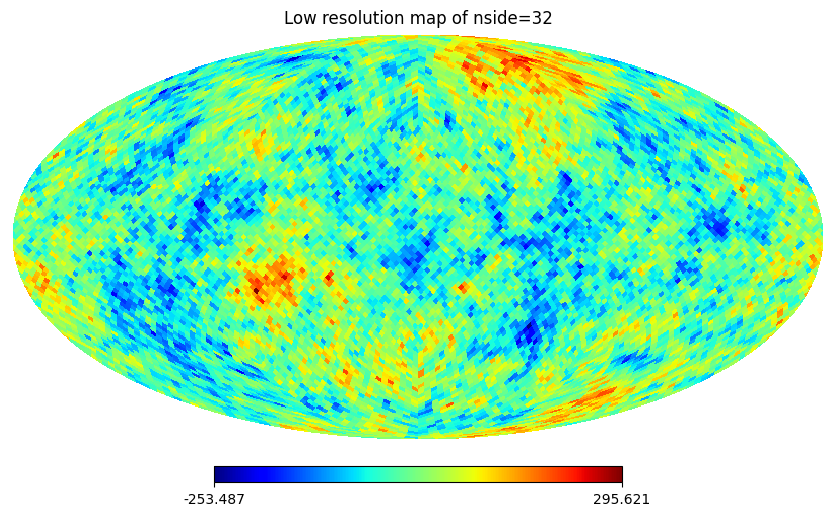

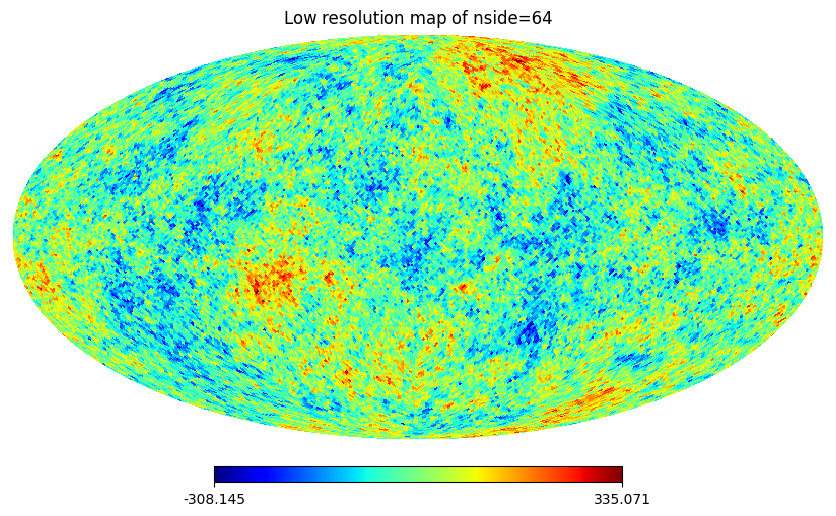

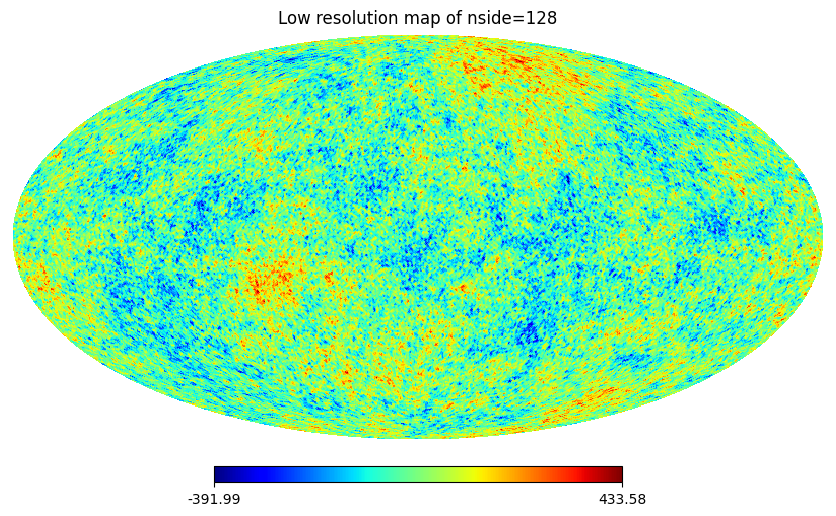

In [ ]:
hp.mollview(cmb_map_high,title="High resolution map of nside=1024",cmap="jet") # Simulating one by one.
hp.mollview(cmb_map_low_1,title="Low resolution map of nside=16",cmap="jet")
hp.mollview(cmb_map_low_2,title="Low resolution map of nside=32",cmap="jet")
hp.mollview(cmb_map_low_3,title="Low resolution map of nside=64",cmap="jet")
hp.mollview(cmb_map_low_4,title="Low resolution map of nside=128",cmap="jet")

In [ ]:
high_cl=hp.anafast(cmb_map_high) # Read cl from original and downgraded maps to compare.
downgraded_cl_1=hp.anafast(cmb_map_low_1)
downgraded_cl_2=hp.anafast(cmb_map_low_2)
downgraded_cl_3=hp.anafast(cmb_map_low_3)
downgraded_cl_4=hp.anafast(cmb_map_low_4)

In [ ]:
print(len(downgraded_cl_1))
print(len(downgraded_cl_2))
print(len(downgraded_cl_3))
print(len(downgraded_cl_4))
print(len(high_cl))

48
96
192
384
3072


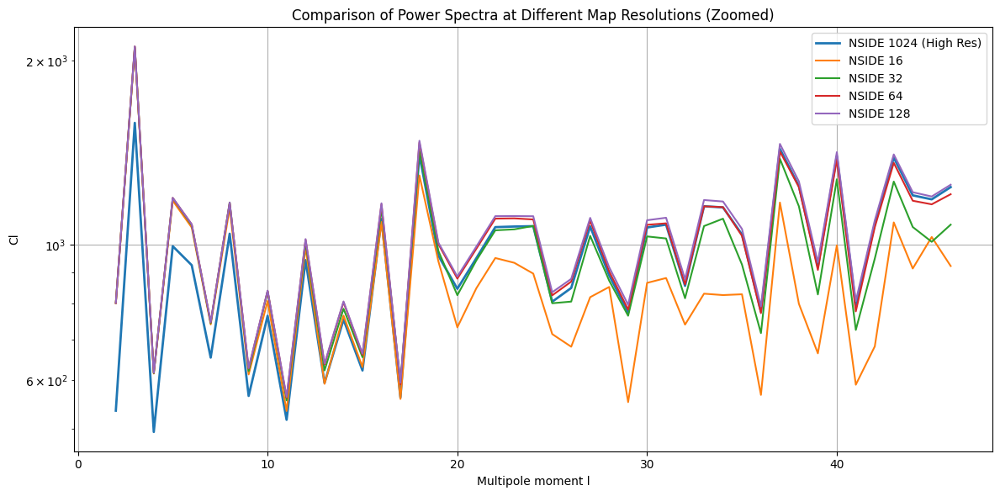

In [ ]:
hi_l = np.arange(0,len(high_cl)) # Define an array of multipole vectors for x-axis.
low_l1= np.arange(0,len(downgraded_cl_1))
low_l2= np.arange(0,len(downgraded_cl_2))
low_l3 = np.arange(0,len(downgraded_cl_3))
low_l4=np.arange(0,len(downgraded_cl_4))
# Plotting all Cls
plt.figure(figsize=(12, 6))
plt.plot(hi_l[2:47], high_cl[2:47]*hi_l[2:47]*(hi_l[2:47])/(2*np.pi), label='NSIDE 1024 (High Res)', linewidth=2)
plt.plot(low_l1[2:47], downgraded_cl_1[2:47]*low_l1[2:47]*(low_l1[2:47]+1)/(2*np.pi), label='NSIDE 16')
plt.plot(low_l2[2:47], downgraded_cl_2[2:47]*low_l2[2:47]*(low_l2[2:47]+1)/(2*np.pi), label='NSIDE 32')
plt.plot(low_l3[2:47], downgraded_cl_3[2:47]*low_l3[2:47]*(low_l3[2:47]+1)/(2*np.pi), label='NSIDE 64')
plt.plot(low_l4[2:47], downgraded_cl_4[2:47]*low_l4[2:47]*(low_l4[2:47]+1)/(2*np.pi), label='NSIDE 128')

plt.yscale('log') # linear scale doesn't give much inference.
plt.xlabel('Multipole moment l')
plt.ylabel('Cl')
plt.title('Comparison of Power Spectra at Different Map Resolutions (Zoomed)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# 5. Write a program to do 1-map operations - such as scaling, division, cutoff, region selection (above/below some limits or outside some chosen range) setting the rest to 0 or healpix_badvalue.

---



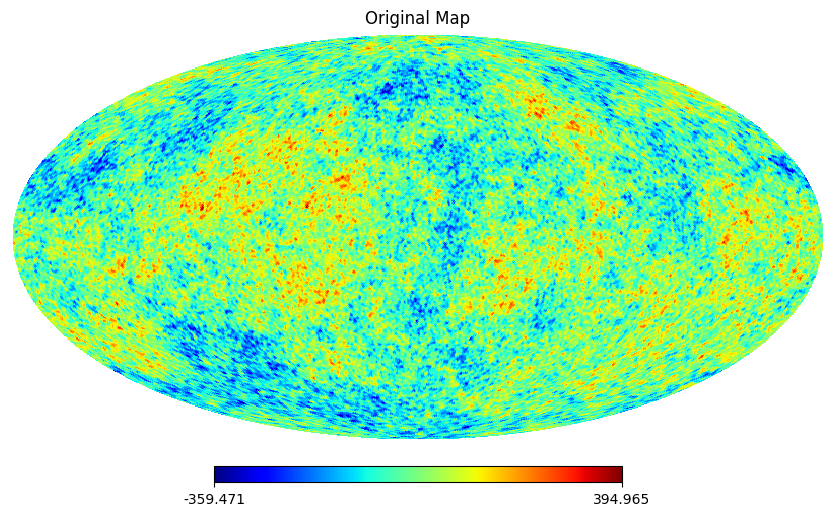

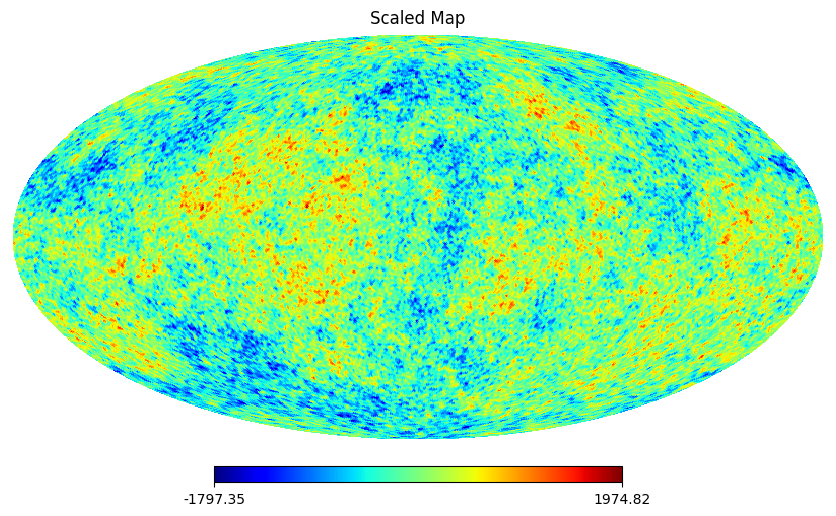

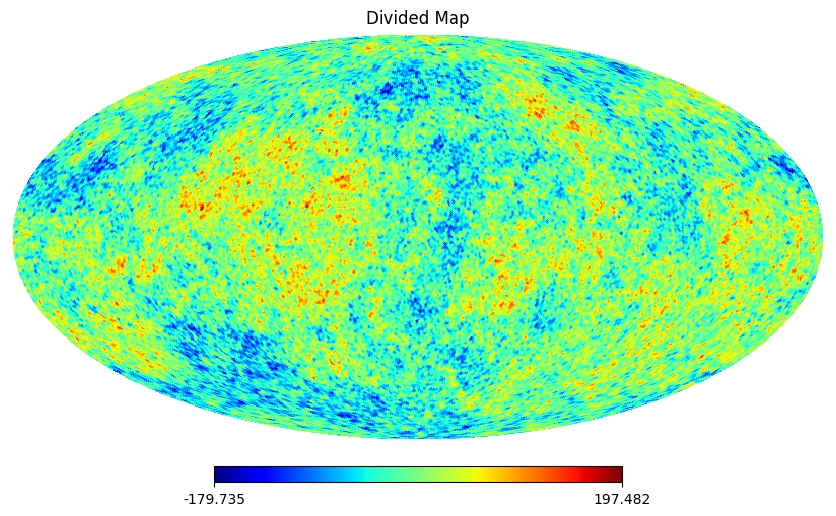

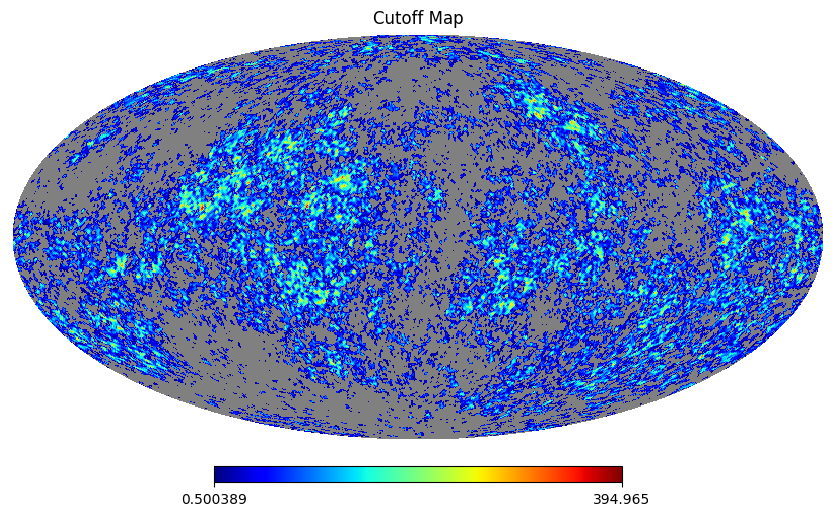

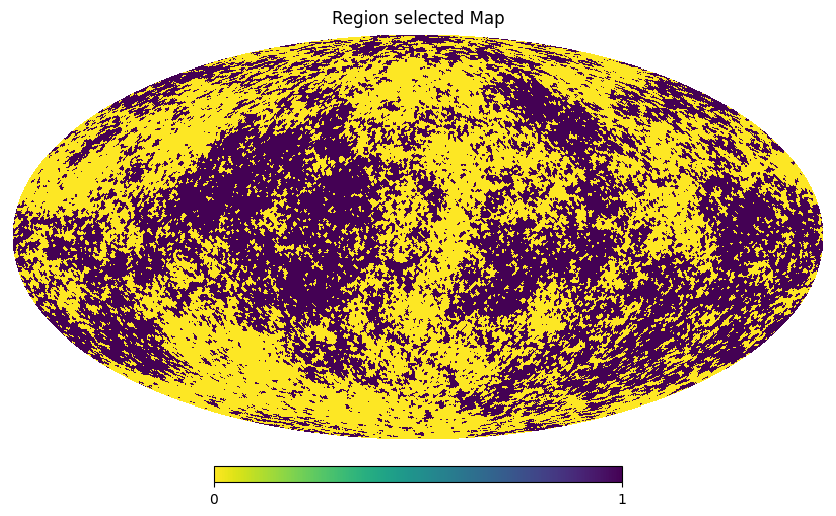

In [ ]:
# Assuming 'map.fits' is in your Google Drive in the same location as 'cl.fits'
map = hp.read_map('/gdrive/MyDrive/Healpix_3.83_2024Nov13/Healpix_3.83/test/map.fits') # Reading map.
hp.mollview(map, title="Original Map",cmap="jet")

scaled_map = map * 5.0 # Scaling map.
divided_map = map / 2.0 # Dividing map.
cutoff_map = np.where(map > 0.5, map, hp.UNSEEN) # Only show the original map where map>0.5 and UNSEEN everywhere else.
region_selected_map = np.where(map > 0.5, 1.0, 0.0) # Only show 1.0 where map>0.5 and 0.0 everywhere else.
hp.mollview(scaled_map, title="Scaled Map",cmap="jet")
hp.mollview(divided_map, title="Divided Map",cmap="jet")
hp.mollview(cutoff_map, title="Cutoff Map",cmap="jet")
hp.mollview(region_selected_map, title="Region selected Map",cmap="viridis_r")

# **6. Write a program to do 2-map operations - like multiplication (masking), division, addition/subtraction, with additional conditions for setting pixels to zero where the division fails for zero values in the second map (denominator).**

---

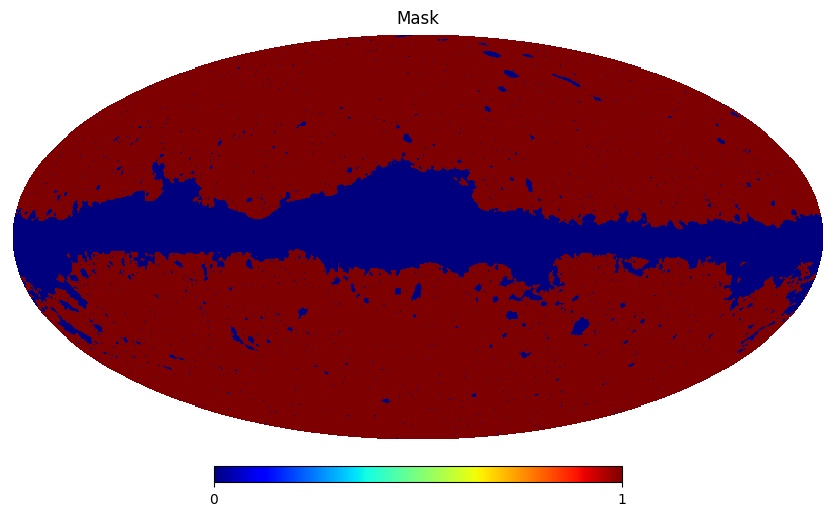

In [ ]:
mask = hp.read_map('/content/drive/MyDrive/COM_Mask_CMB-common-Mask-Int_2048_R3.00.fits') # Reading mask.
hp.mollview(mask, title="Mask",cmap="jet")

In [ ]:
map1 = hp.read_map('/content/drive/MyDrive/Healpix_3.83_2024Nov13/Healpix_3.83/test/map.fits')
map2 = hp.read_map('/content/drive/MyDrive/Healpix_3.83_2024Nov13/Healpix_3.83/test/map_mf.fits') # Reading the maps from mounted drive.

In [ ]:
# Check the nside of the maps
nside_map1 = hp.get_nside(map1)
nside_mask = hp.get_nside(mask)
nside_map2 = hp.get_nside(map2)
print(f"NSIDE of map1: {nside_map1}")
print(f"NSIDE of mask: {nside_mask}")
print(f"NSIDE of map2: {nside_map2}")

NSIDE of map1: 128
NSIDE of mask: 2048
NSIDE of map2: 128


In [ ]:
# Regrade map1 to match the nside of the mask if they are different
if nside_map1 != nside_mask:
    print(f"Regrading map1 from nside={nside_map1} to nside={nside_mask}")
    map1_regraded = hp.ud_grade(map1, nside_out=nside_mask)
else:
    map1_regraded = map1

# Regrade map2 to match the nside of map1_regraded if they are different
if nside_map2 != hp.get_nside(map1_regraded): # Use hp.get_nside(map1_regraded) to be sure
    print(f"Regrading map2 from nside={nside_map2} to nside={hp.get_nside(map1_regraded)}")
    map2_regraded = hp.ud_grade(map2, nside_out=hp.get_nside(map1_regraded))
else:
    map2_regraded = map2

# Perform operations with the regraded maps
multiplied_map = map1_regraded * mask # Masking operation
added_map = map1_regraded + map2_regraded # Addition of maps.
subtracted_map = map1_regraded - map2_regraded # Subtraction of maps.


# For dividing, we have to make sure that denominator !=0.
# Use a small tolerance to avoid division by near-zero values
denominator_threshold = 1e-9
dividing_maps = np.where(np.abs(map2_regraded) !=0, map1_regraded / map2_regraded, hp.UNSEEN) # Division of maps, set to UNSEEN where map2 is close to zero.

Regrading map1 from nside=128 to nside=2048
Regrading map2 from nside=128 to nside=2048


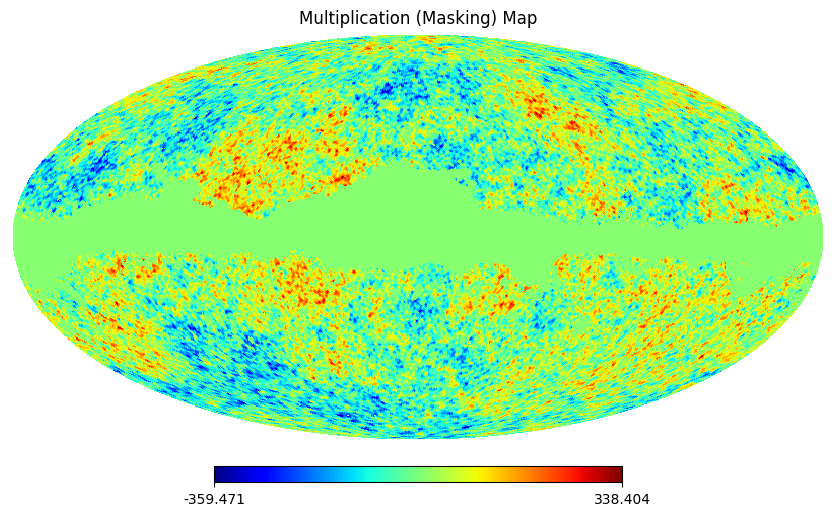

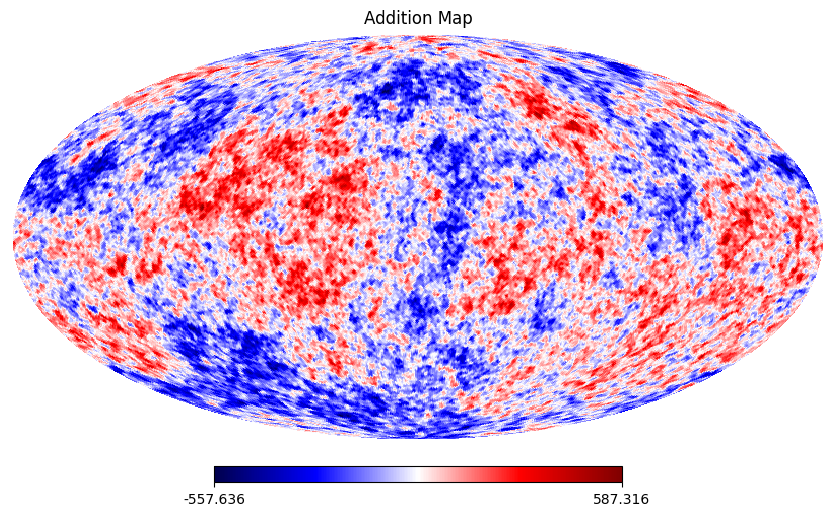

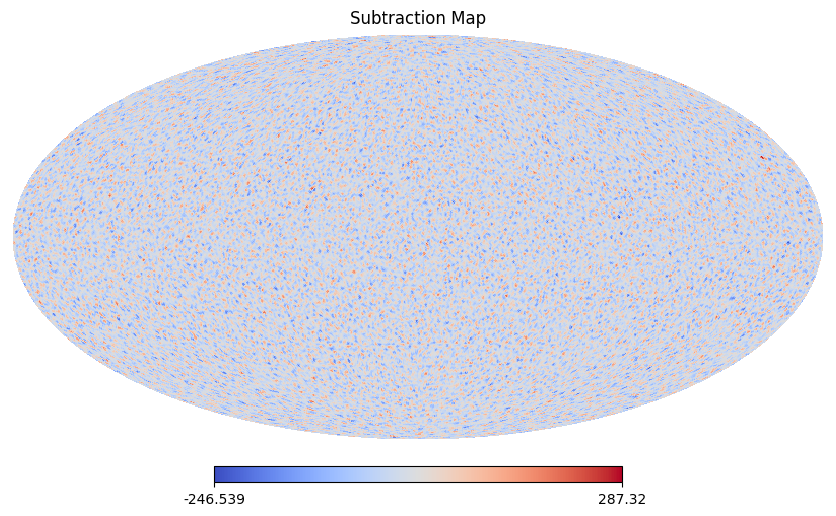

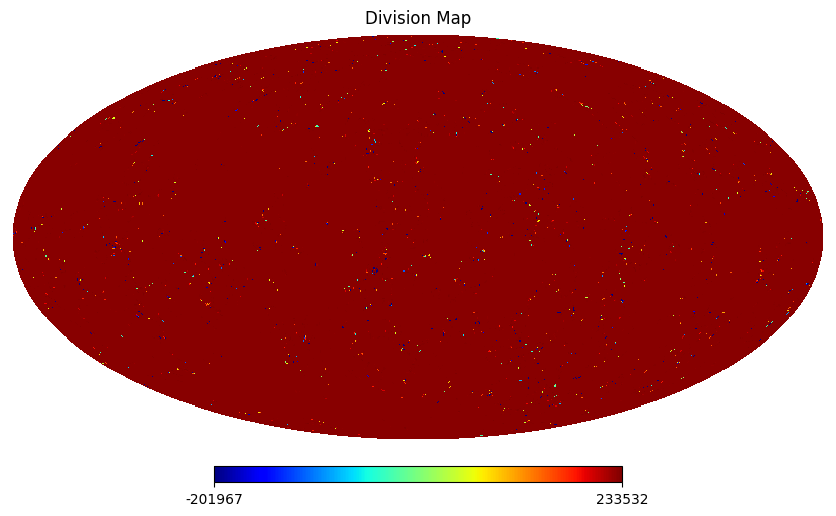

In [ ]:
# Visualization
hp.mollview(multiplied_map, title='Multiplication (Masking) Map',cmap="jet")
hp.mollview(added_map, title='Addition Map',cmap="seismic")
hp.mollview(subtracted_map, title='Subtraction Map',cmap="coolwarm")
hp.mollview(dividing_maps, title='Division Map',cmap="jet",norm="hist")

# **Methods for CMB map analysis**

---

Raelyn Marguerite Sullivan, Lukas Tobias Hergt, Douglas Scott

Figure 1: Cosmic Variance—Generate & Plot CMB Realizations and Their Spectra


In [ ]:
nside, lmax = 2048, 3*2048-1

# Load Planck theoretical TT spectrum from cl_planck1.fits
cl_tt = hp.read_cl('/content/drive/MyDrive/Healpix_3.83/test/cl_planck1.fits')

num_maps = 10
ell = np.arange(lmax+1)
plt.figure(figsize=(10,6))

for i in range(num_maps):
    map = hp.synfast(cl_tt, nside=nside, lmax=lmax, verbose=False)
    cl_map = hp.anafast(map, lmax=lmax)
    dl_map = ell * (ell + 1) / (2 * np.pi) * cl_map
    plt.semilogy(ell[2:200], dl_map[2:200], alpha=0.3)

plt.semilogy(ell[2:200], ell[2:200]*(ell[2:200]+1)/(2*np.pi)*cl_tt[2:200], 'k-', linewidth=2, label='Theory')
plt.xlabel(r'$\ell$')
plt.ylabel(r'$D_\ell\ (\mu K^2)$')
plt.title('Cosmic Variance Demonstration')
plt.legend()
plt.show()


/tmp/ipython-input-26322547.py:15: HealpyDeprecationWarning: "verbose" was deprecated in version 1.15.0 and will be removed in a future version. 
  map = hp.synfast(cl_tt, nside=nside, lmax=lmax, verbose=False)


Figure 2: Gaussian Beam Functions


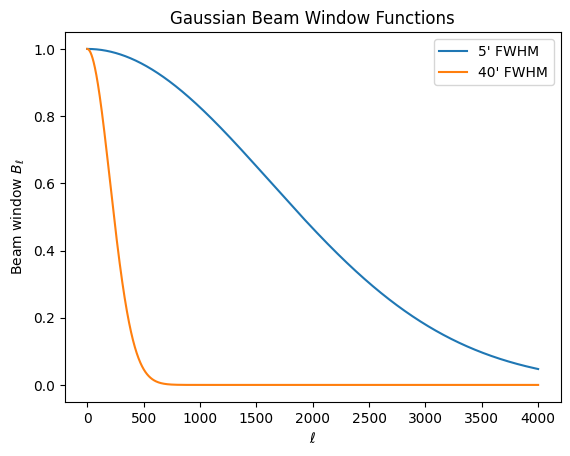

In [ ]:
def gaussian_beam_bl(ells, fwhm_arcmin):
    sigma = np.radians(fwhm_arcmin / 60.) / np.sqrt(8 * np.log(2))
    return np.exp(-0.5 * ells * (ells + 1) * sigma ** 2)

ells = np.arange(4000)
beam_5 = gaussian_beam_bl(ells, 5)
beam_40 = gaussian_beam_bl(ells, 40)

plt.plot(ells, beam_5, label="5' FWHM")
plt.plot(ells, beam_40, label="40' FWHM")
plt.xlabel(r'$\ell$')
plt.ylabel(r'Beam window $B_\ell$')
plt.title('Gaussian Beam Window Functions')
plt.legend(); plt.show()


Figure 3: Power Spectra after Beam Smoothing


In [ ]:
nside, lmax = 2048, 3*2048-1
ell = np.arange(lmax+1)
cl_tt = hp.read_cl('/content/drive/MyDrive/Healpix_3.83/test/cl_planck1.fits')

dl_tt = ell * (ell + 1) / (2 * np.pi) * cl_tt
dl_tt_bl_5 = dl_tt * beam_5[:lmax+1]**2
dl_tt_bl_40 = dl_tt * beam_40[:lmax+1]**2

plt.plot(ell, dl_tt, label='Theory')
plt.plot(ell, dl_tt_bl_5, label="5' FWHM")
plt.plot(ell, dl_tt_bl_40, label="40' FWHM")
plt.xlabel(r'$\ell$'); plt.ylabel(r'$D_\ell$')
plt.title('Beam Function Damping')
plt.legend(); plt.show()


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/Healpix_3.83/test/cl_planck1.fits'

Figure 4: Pixel Window Function Effects


<>:10: SyntaxWarning: invalid escape sequence '\e'
<>:10: SyntaxWarning: invalid escape sequence '\e'
/tmp/ipython-input-404428347.py:10: SyntaxWarning: invalid escape sequence '\e'
  plt.legend(); plt.title('Pixel Window Functions $P_\ell$')


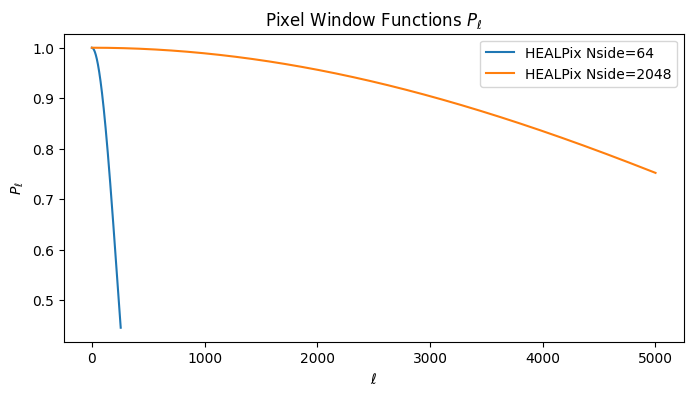

In [ ]:
pwin64 = hp.pixwin(64, lmax=200)
pwin2048 = hp.pixwin(2048, lmax=5000)
l64 = np.arange(len(pwin64))
l2048 = np.arange(len(pwin2048))
plt.plot(l64, pwin64, label='NSIDE=64')
plt.plot(l2048, pwin2048, label='NSIDE=2048')
plt.legend(); plt.xlabel(r'$\ell$'); plt.ylabel('Pixel window $P_\ell$'); plt.show()


/tmp/ipython-input-1125043415.py:14: HealpyDeprecationWarning: "verbose" was deprecated in version 1.15.0 and will be removed in a future version. 
  cmb_map_lo = hp.alm2map(alm_lo, nside_lo, verbose=False)


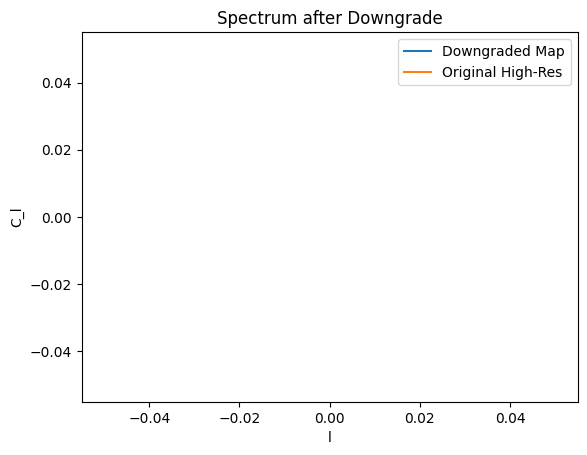

In [ ]:
# Load your CMB simulation
nside = 512
lmax = 3*nside - 1

cmb_map = hp.read_map('/content/drive/MyDrive/Healpix_3.83/test/map.fits')
npix = hp.nside2npix(nside)
theta, phi = hp.pix2ang(nside, np.arange(npix)

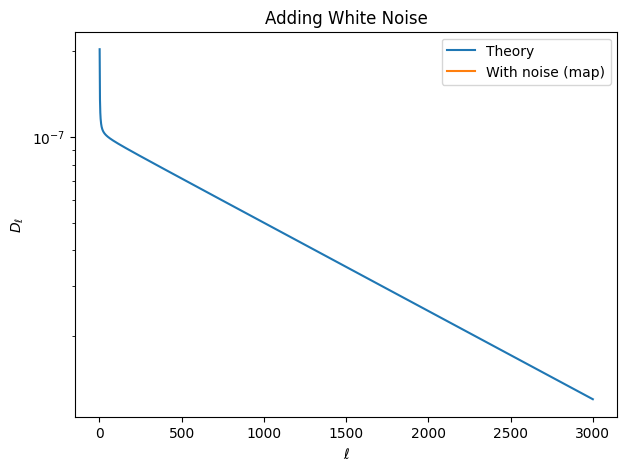

In [ ]:
# Galactic cut: |b| > 20 deg (exclude polar, keep central band)
mask = np.abs(np.pi/2 - theta) > np.radians(20)  # Boolean mask

# Smooth/apodize mask edges (Gaussian, sigma in pixels)
mask_apo = gaussian_filter(mask.astype(float), sigma=10)

plt.figure()
hp.mollview(mask_apo, title="Apodized Galactic Mask")
plt.show()


<Figure size 700x500 with 0 Axes>

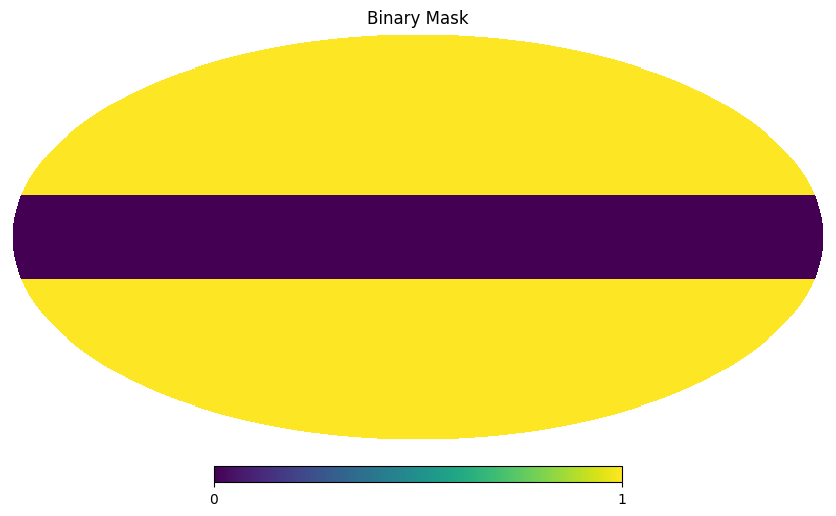

<Figure size 700x500 with 0 Axes>

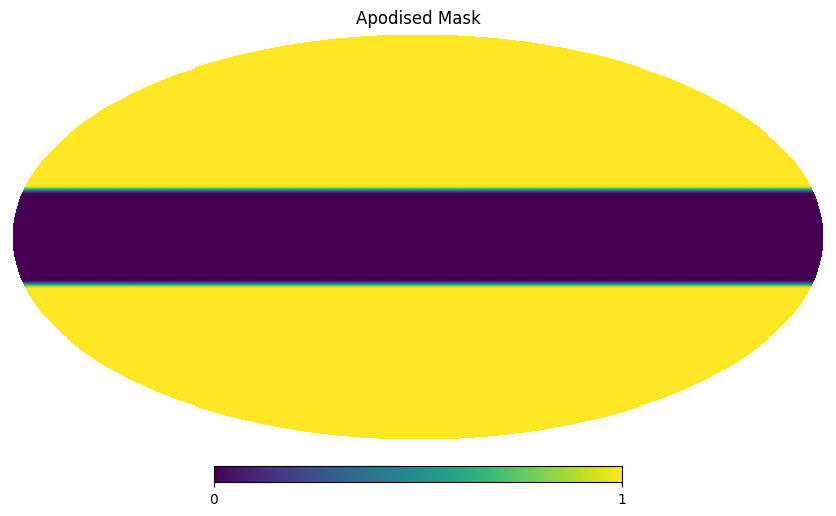

In [ ]:
# Create NaMaster field with apodized mask
field = nmt.NmtField(mask_apo, [cmb_map])

# Define ell binning (width 20)
binner = nmt.NmtBin.from_lmax_linear(lmax=lmax, n_bands=20)

# Compute workspace (coupling matrix)
wsp = nmt.NmtWorkspace()
wsp.compute_coupling_matrix(field, field, binner)

# Coupled (raw) power spectrum
cl_coupled = nmt.compute_coupled_cell(field, field)

# Decouple (deconvolve mask/bias)
cl_decoupled = wsp.decouple_cell(cl_coupled)  # shape: [n_maps, n_bandpowers]

# ell bin centers
ell_bin = binner.get_effective_ells()


In [ ]:
plt.figure(figsize=(8,5))
plt.plot(ell_bin, cl_decoupled[0], label='Decoupled Masked $C_\ell$')
plt.xlabel(r'Multipole moment $\ell$')
plt.ylabel(r'$C_\ell$')
plt.title('Decoupled Power Spectrum: Masked vs Apodized Map')
plt.legend()
plt.grid()
plt.show()


✓ PyMaster available for pseudo-Cl analysis

SETTING UP CMB MAP ANALYSIS COMPARISON
✓ Loaded Planck theoretical spectrum from file
✓ Generated CMB map with nside=512
✓ Loaded WMAP analysis mask from file
✓ Mask loaded/created, fsky = 0.748

CREATING DIFFERENT MASK TYPES
✓ Created mask types: common, galactic, point_source

COMPARING POWER SPECTRUM METHODS
✓ Computed reference unmasked power spectrum

Generating Figure 8: Apodization and fsky effects...


TypeError: remove_dipole() got an unexpected keyword argument 'mask'

In [ ]:
cl_theory = hp.read_cl('/content/drive/MyDrive/Healpix_3.83/test/cl_planck1.fits')
dl_theory = ell_bin * (ell_bin + 1) / (2*np.pi) * cl_theory[ell_bin.astype(int)]
plt.semilogy(ell_bin, cl_decoupled[0], label='Recovered $C_\ell$ (Masked)')
plt.semilogy(ell_bin, dl_theory, 'k--', label='Theory')
plt.xlabel(r'Multipole moment $\ell$')
plt.ylabel(r'$D_\ell$')
plt.legend(); plt.show()


# **7. Recover Input Cl from 100 Simulations + Plot Mean & Errors after masking the original map**

---



Before doing multiple simulations as part of exercise 7, do the following:

1. Plot Cl of a CMB simulation with nside=512 or 1024
2. Apply a binary (1-0) mask as it is on this simulated CMB map, get the power spectrum and plot it.
3. Using Namaster get the pseudo-fullsky Cl of the masked CMB sky map and plot it along with the above
4. Now apply apodization choosing "C2" scheme in Namaster. Then use the apodized mask on the CMB map to derive the pseudo-fullsky Cl.
5. Finally plot the theoretical power spectrum also along with all the other four Cl mentioned above.

<>:10: SyntaxWarning: invalid escape sequence '\e'
<>:11: SyntaxWarning: invalid escape sequence '\e'
<>:10: SyntaxWarning: invalid escape sequence '\e'
<>:11: SyntaxWarning: invalid escape sequence '\e'
/tmp/ipython-input-2411183458.py:10: SyntaxWarning: invalid escape sequence '\e'
  plt.xlabel('Multipole moment $\ell$', fontsize=14)
/tmp/ipython-input-2411183458.py:11: SyntaxWarning: invalid escape sequence '\e'
  plt.ylabel('$D_\ell = \ell(\ell+1)C_\ell/(2\pi)$', fontsize=14)


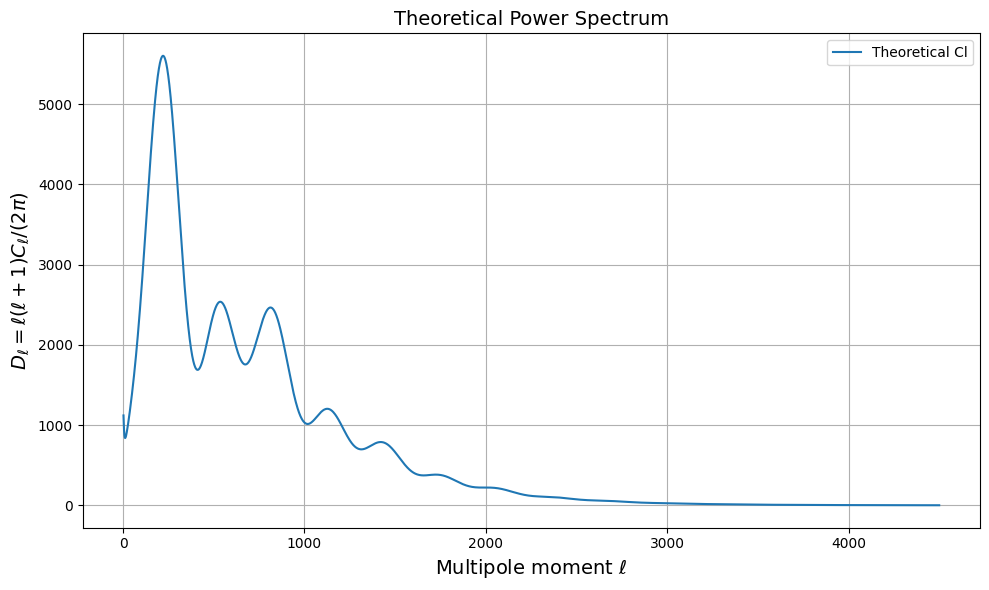

In [ ]:
nside = 512
lmax  = 3 * nside - 1
# Theoretical Cl:
Cll = hp.read_cl('/content/drive/MyDrive/Healpix_3.83_2024Nov13/Healpix_3.83/test/cl_planck1.fits')
Cl_th = Cll[0]
# Plotting theoretical Cl:
ell_th = np.arange(len(Cl_th))
plt.figure(figsize=(10, 6))
plt.plot(ell_th[2:], Cl_th[2:] * ell_th[2:] * (ell_th[2:] + 1) / (2 * np.pi), label='Theoretical Cl')
plt.xlabel('Multipole moment $\ell$', fontsize=14)
plt.ylabel('$D_\ell = \ell(\ell+1)C_\ell/(2\pi)$', fontsize=14)
plt.title('Theoretical Power Spectrum', fontsize=14)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

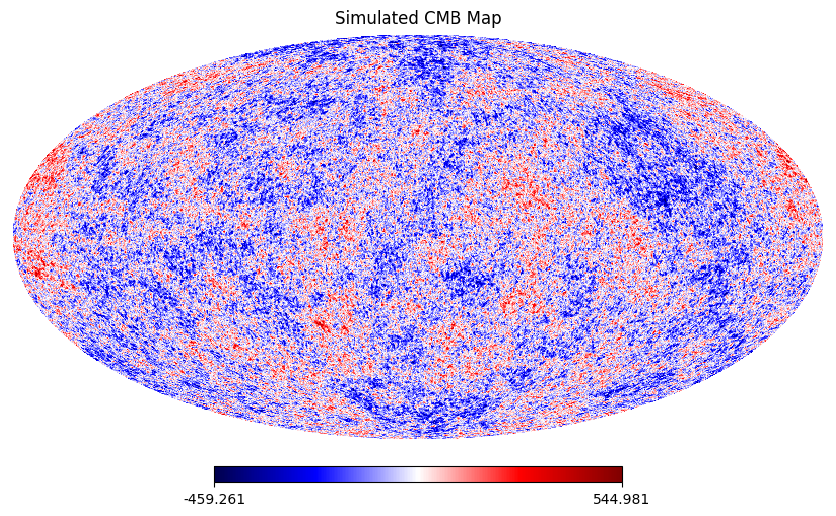

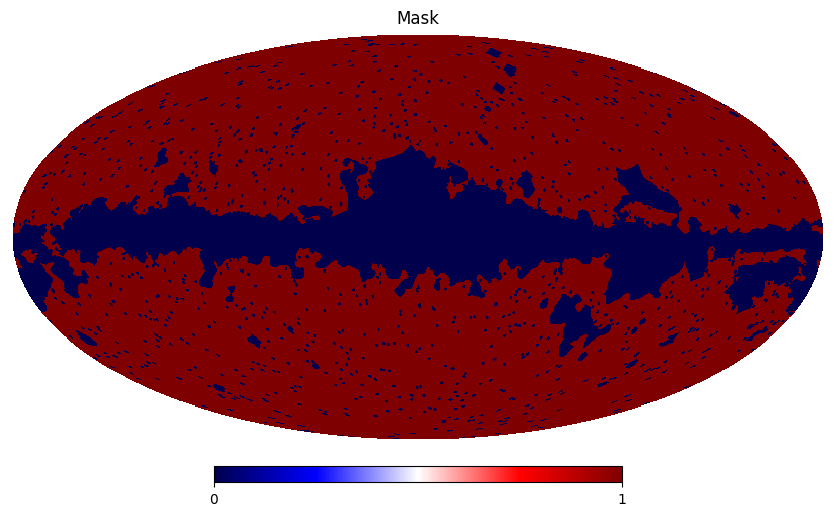

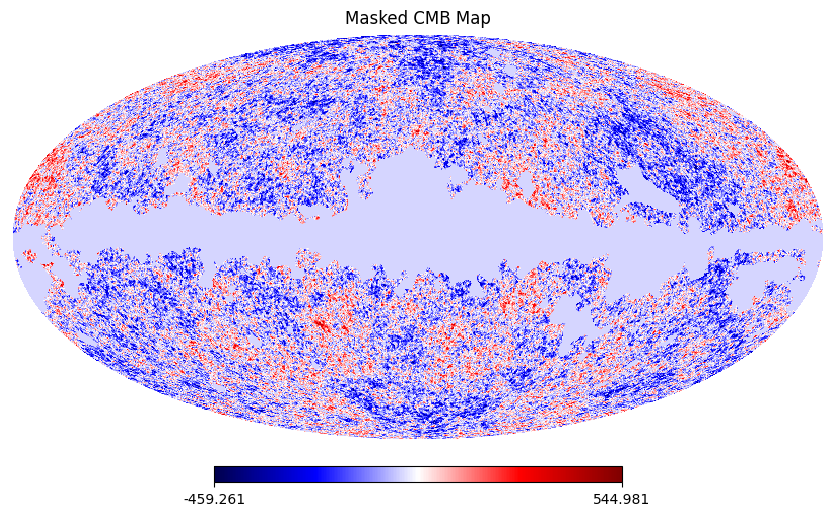

In [ ]:
# Simulating the CMB map:
map = hp.synfast(Cl_th, nside=nside, lmax=lmax)
hp.mollview(map, title='Simulated CMB Map', cmap='seismic')
# Applying the mask:
mask = hp.read_map('/content/drive/MyDrive/Healpix_3.83_2024Nov13/Healpix_3.83/test/wmap_temperature_kq85_analysis_mask_r9_9yr_v5.fits')
hp.mollview(mask, title='Mask', cmap='seismic')
masked_map = map * mask
hp.mollview(masked_map, title='Masked CMB Map', cmap='seismic')

<>:8: SyntaxWarning: invalid escape sequence '\e'
<>:9: SyntaxWarning: invalid escape sequence '\e'
<>:8: SyntaxWarning: invalid escape sequence '\e'
<>:9: SyntaxWarning: invalid escape sequence '\e'
/tmp/ipython-input-233713810.py:8: SyntaxWarning: invalid escape sequence '\e'
  plt.xlabel('Multipole moment $\ell$', fontsize=14)
/tmp/ipython-input-233713810.py:9: SyntaxWarning: invalid escape sequence '\e'
  plt.ylabel('$D_\ell = \ell(\ell+1)C_\ell/(2\pi)$', fontsize=14)


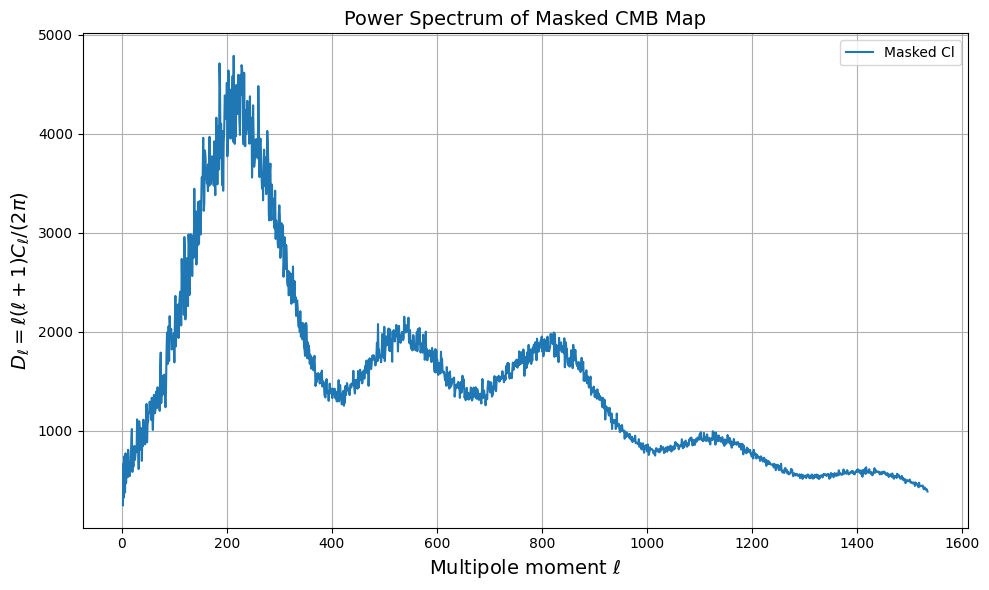

In [ ]:
# Retreiving the Power Spectrum from masked map:
masked_cl = hp.anafast(masked_map)

# Plotting the masked Cl
ell_masked = np.arange(len(masked_cl))
plt.figure(figsize=(10, 6))
plt.plot(ell_masked[2:], masked_cl[2:] * ell_masked[2:] * (ell_masked[2:] + 1) / (2 * np.pi), label='Masked Cl')
plt.xlabel('Multipole moment $\ell$', fontsize=14)
plt.ylabel('$D_\ell = \ell(\ell+1)C_\ell/(2\pi)$', fontsize=14)
plt.title('Power Spectrum of Masked CMB Map', fontsize=14)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
# 1. Define field with mask applied
field = nmt.NmtField(mask, [map])

# 2. Define binning scheme (you can tweak bin width for smoothness)
ells = np.arange(lmax+1)
binning = nmt.NmtBin.from_nside_linear(nside, 20)   # bins of width 20 l

# 3. Compute pseudo-Cl using NaMaster
cl_coupled = nmt.compute_coupled_cell(field, field)

# 4. Decouple (apply MASTER correction)
w = nmt.NmtWorkspace()
w.compute_coupling_matrix(field, field, binning)
cl_decoupled = w.decouple_cell(cl_coupled)

# 5. Prepare theoretical spectrum binned in same way
Cl_binned = w.decouple_cell(nmt.compute_coupled_cell(field, field))

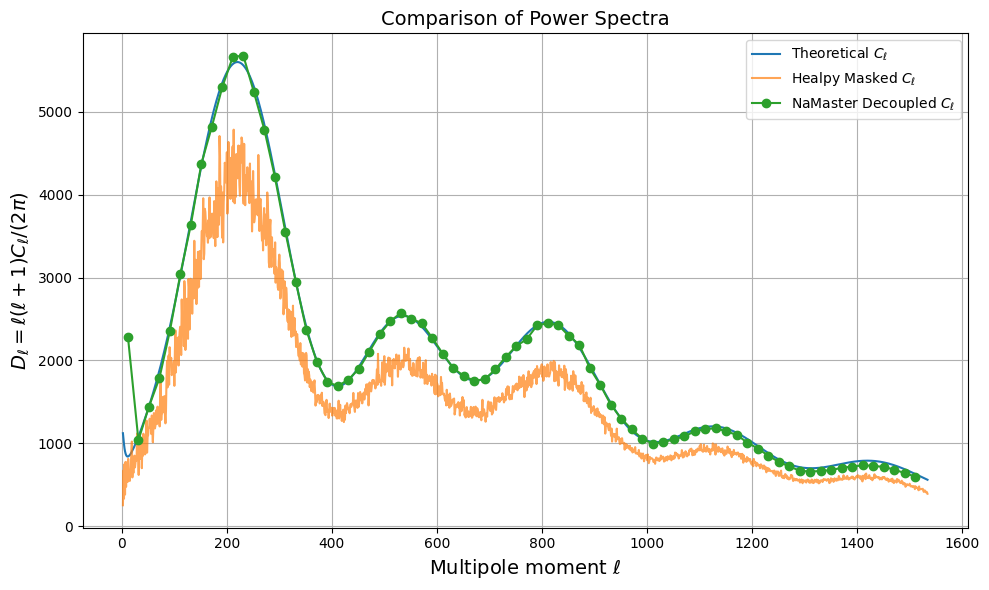

In [ ]:
# 6. Plot comparison
plt.figure(figsize=(10,6))

# Theoretical full-sky Cl
# Use the truncated Cl_th and ell_th with the correct range
plt.plot(ell_th[2:], Cl_th[2:] * ell_th[2:]*(ell_th[2:]+1)/(2*np.pi),
         label="Theoretical $C_\\ell$")

# Healpy masked Cl
plt.plot(ells[2:], masked_cl[2:] * ells[2:]*(ells[2:]+1)/(2*np.pi),
         label="Healpy Masked $C_\\ell$", alpha=0.7)

# NaMaster pseudo-Cl (decoupled)
ell_b = binning.get_effective_ells()
plt.plot(ell_b, cl_decoupled[0] * ell_b*(ell_b+1)/(2*np.pi),
         'o-', label="NaMaster Decoupled $C_\\ell$")

plt.xlabel("Multipole moment $\\ell$", fontsize=14)
plt.ylabel("$D_\\ell = \\ell(\\ell+1)C_\\ell/(2\\pi)$", fontsize=14)
plt.title("Comparison of Power Spectra", fontsize=14)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
# 1. Apodize mask with C2 scheme
apod_deg = 1.0  # Apodization length in degrees (tune this: 0.5–2 usually good)
mask_apo = nmt.mask_apodization(mask, apod_deg, apotype="C2")

# 2. Define field using apodized mask
field_apo = nmt.NmtField(mask_apo, [map])

# 3. Define binning
binning = nmt.NmtBin.from_nside_linear(nside, 20)   # bins of width 20

# 4. Compute coupled and decoupled Cl
cl_coupled_apo = nmt.compute_coupled_cell(field_apo, field_apo)
w_apo = nmt.NmtWorkspace()
w_apo.compute_coupling_matrix(field_apo, field_apo, binning)
cl_decoupled_apo = w_apo.decouple_cell(cl_coupled_apo)

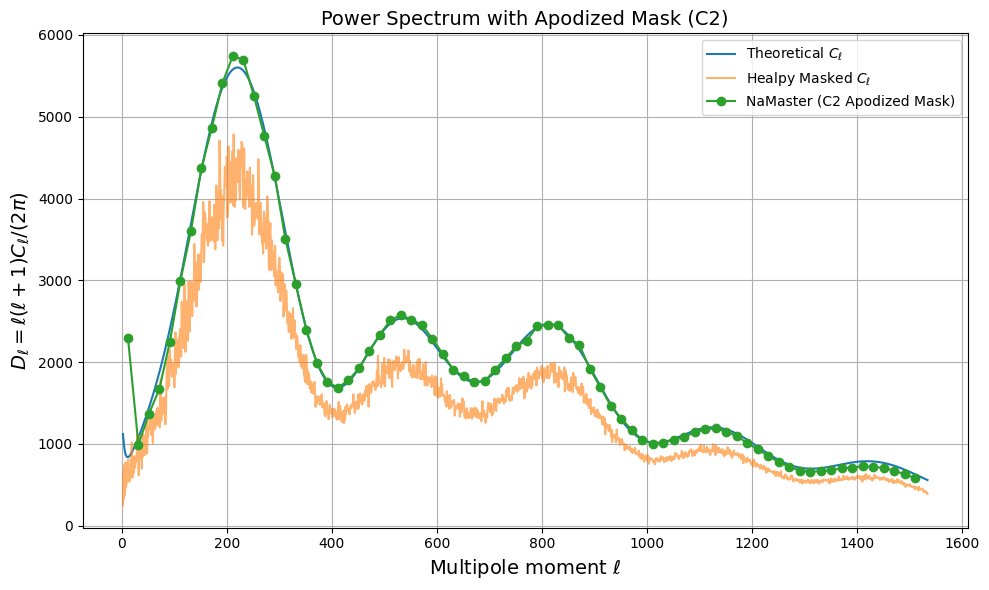

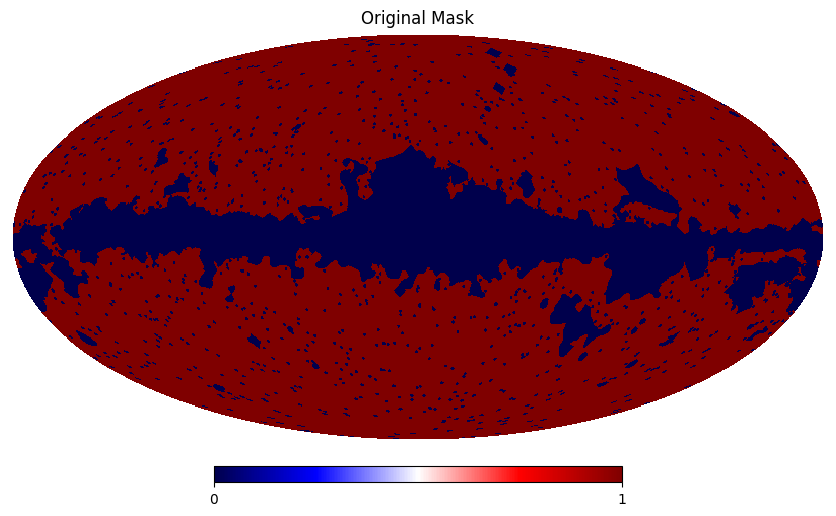

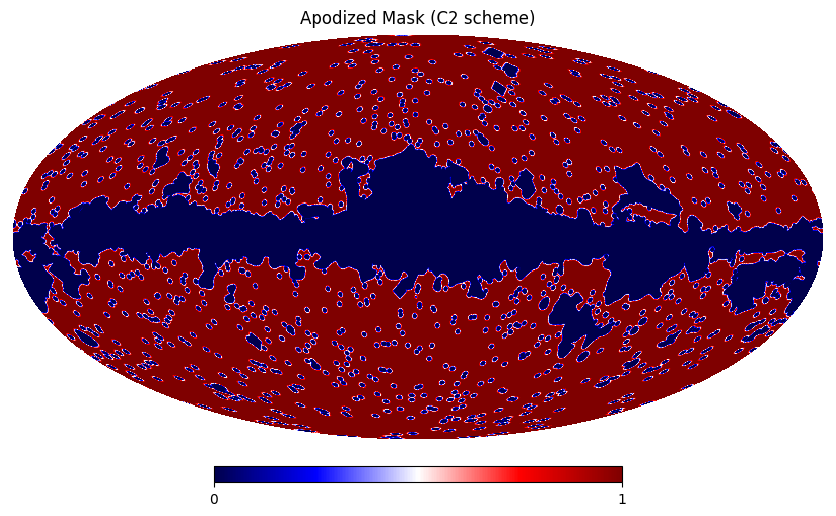

In [ ]:
plt.figure(figsize=(10,6))

# Theoretical Cl
ells = np.arange(len(Cl_th))
plt.plot(ells[2:], Cl_th[2:] * ells[2:]*(ells[2:]+1)/(2*np.pi),
         label="Theoretical $C_\\ell$")

# Healpy masked Cl
masked_cl = hp.anafast(map * mask)   # using your earlier masked map
ell_masked = np.arange(len(masked_cl))
plt.plot(ell_masked[2:], masked_cl[2:] * ell_masked[2:]*(ell_masked[2:]+1)/(2*np.pi),
         label="Healpy Masked $C_\\ell$", alpha=0.6)

# NaMaster with apodized mask
ell_b = binning.get_effective_ells()
plt.plot(ell_b, cl_decoupled_apo[0] * ell_b*(ell_b+1)/(2*np.pi),
         'o-', label="NaMaster (C2 Apodized Mask)")

plt.xlabel("Multipole moment $\\ell$", fontsize=14)
plt.ylabel("$D_\\ell = \\ell(\\ell+1)C_\\ell/(2\\pi)$", fontsize=14)
plt.title("Power Spectrum with Apodized Mask (C2)", fontsize=14)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Optional: visualize mask before/after apodization
hp.mollview(mask, title="Original Mask", cmap="seismic")
hp.mollview(mask_apo, title="Apodized Mask (C2 scheme)", cmap="seismic")

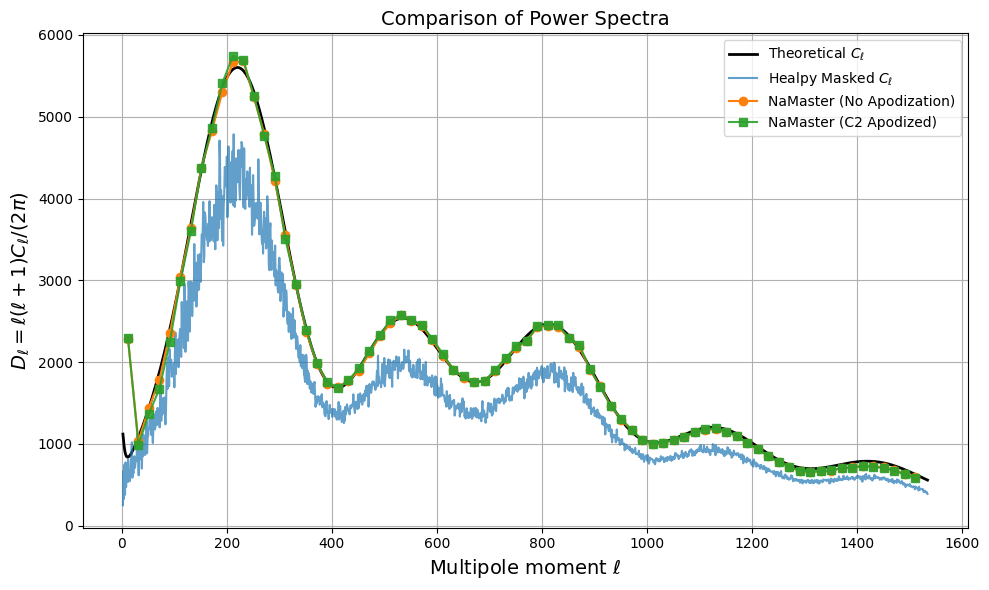

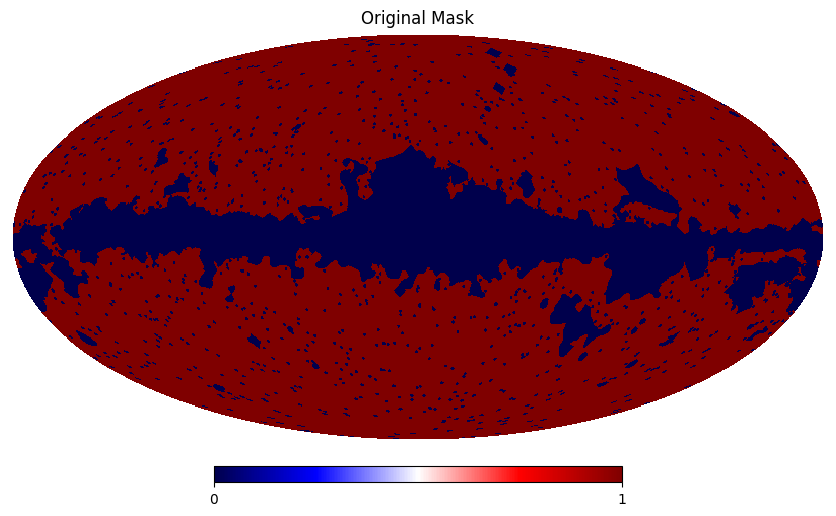

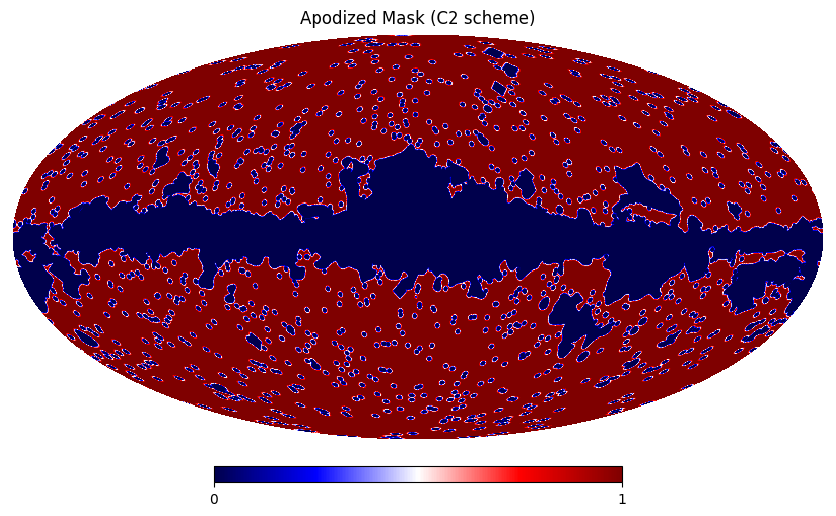

In [ ]:
# 1. Healpy masked Cl
# ------------------------------
masked_map = map * mask
masked_cl = hp.anafast(masked_map)
ell_masked = np.arange(len(masked_cl))

# ------------------------------
# 2. NaMaster (sharp mask, no apodization)
# ------------------------------
field = nmt.NmtField(mask, [map])
binning = nmt.NmtBin.from_nside_linear(nside, 20)
cl_coupled = nmt.compute_coupled_cell(field, field)
w = nmt.NmtWorkspace()
w.compute_coupling_matrix(field, field, binning)
cl_decoupled = w.decouple_cell(cl_coupled)
ell_b = binning.get_effective_ells()

# ------------------------------
# 3. NaMaster with apodized mask (C2 scheme)
# ------------------------------
apod_deg = 1.0   # apodization length in degrees
mask_apo = nmt.mask_apodization(mask, apod_deg, apotype="C2")
field_apo = nmt.NmtField(mask_apo, [map])
cl_coupled_apo = nmt.compute_coupled_cell(field_apo, field_apo)
w_apo = nmt.NmtWorkspace()
w_apo.compute_coupling_matrix(field_apo, field_apo, binning)
cl_decoupled_apo = w_apo.decouple_cell(cl_coupled_apo)
ell_b_apo = binning.get_effective_ells()

# ------------------------------
# 4. Plot all together
# ------------------------------
plt.figure(figsize=(10,6))

# Theoretical Cl
ells = np.arange(len(Cl_th))
plt.plot(ells[2:], Cl_th[2:] * ells[2:]*(ells[2:]+1)/(2*np.pi),
         label="Theoretical $C_\\ell$", lw=2, color="black")

# Healpy masked Cl
plt.plot(ell_masked[2:], masked_cl[2:] * ell_masked[2:]*(ell_masked[2:]+1)/(2*np.pi),
         label="Healpy Masked $C_\\ell$", alpha=0.7)

# NaMaster (sharp mask)
plt.plot(ell_b, cl_decoupled[0] * ell_b*(ell_b+1)/(2*np.pi),
         'o-', label="NaMaster (No Apodization)")

# NaMaster (C2 apodized mask)
plt.plot(ell_b_apo, cl_decoupled_apo[0] * ell_b_apo*(ell_b_apo+1)/(2*np.pi),
         's-', label="NaMaster (C2 Apodized)", alpha=0.9)

plt.xlabel("Multipole moment $\\ell$", fontsize=14)
plt.ylabel("$D_\\ell = \\ell(\\ell+1)C_\\ell/(2\\pi)$", fontsize=14)
plt.title("Comparison of Power Spectra", fontsize=14)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Optional: visualize masks
hp.mollview(mask, title="Original Mask", cmap="seismic")
hp.mollview(mask_apo, title="Apodized Mask (C2 scheme)", cmap="seismic")